For this lab, we will first need to load a dataset of images with Python.

There are several libraries to do so; however, keras already implements an image loading module.

We want to load a dataset of images into Python. The dataset is saved onto the `dataset` subfolder, whose structure is the following:

```
dataset
  |
  - cat
    # some images of cats
  - dog
    # some images of dogs
```

We see that the folder structure already separates the images into two classes: the labels are hence already defined for these two classes.

In [18]:
from PIL import Image
import numpy as np
from keras import preprocessing

Let's first load one single image. Python has several ways to do so.

One of the libraries for loading images is called PIL (or Pillow) - Python Image Library.

We use Image.open (from the PIL.Image module):

Type of image: <class 'PIL.JpegImagePlugin.JpegImageFile'> - Size of image: (1920, 1279)


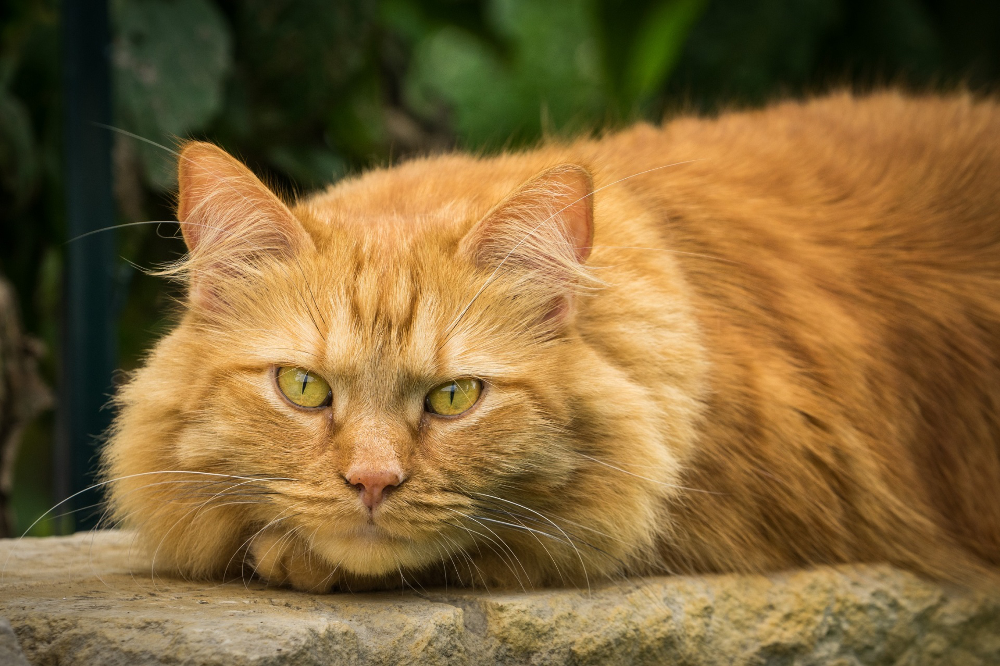

In [21]:
image_path = "dataset/cat/R.jpg"
img = Image.open(image_path)
print(f"Type of image: {type(img)} - Size of image: {img.size}")
img

For Machine Learning, we often need to use the array representation of an image.

Numpy automatically recognizes a PIL Image in the construction of an array:

In [22]:
img_array = np.array(img)
print(f"Shape of array: {img_array.shape} - data type: {img_array.dtype}")
img_array

Shape of array: (1279, 1920, 3) - data type: uint8


array([[[  0,   5,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [  5,  11,   1],
        [  5,  11,   1],
        [  4,  10,   0]],

       [[  0,   5,   0],
        [  0,   5,   0],
        [  0,   5,   0],
        ...,
        [  5,  11,   1],
        [  5,  11,   1],
        [  4,  10,   0]],

       [[  0,   5,   0],
        [  0,   5,   0],
        [  0,   5,   0],
        ...,
        [  5,  11,   1],
        [  6,  12,   2],
        [  5,  11,   1]],

       ...,

       [[107,  99,  86],
        [109, 101,  88],
        [109, 101,  88],
        ...,
        [ 80,  71,  38],
        [ 79,  70,  37],
        [ 81,  70,  38]],

       [[105,  97,  84],
        [106,  98,  85],
        [107,  99,  86],
        ...,
        [ 82,  72,  37],
        [ 82,  72,  37],
        [ 83,  73,  38]],

       [[104,  96,  83],
        [105,  97,  84],
        [106,  98,  85],
        ...,
        [ 83,  73,  38],
        [ 83,  73,  38],
        [ 84,  74,  39]]

**Question**: notice the data type `dtype = uint8`. What does this mean?

In [23]:
img_array.astype("float32")

array([[[  0.,   5.,   0.],
        [  0.,   4.,   0.],
        [  0.,   4.,   0.],
        ...,
        [  5.,  11.,   1.],
        [  5.,  11.,   1.],
        [  4.,  10.,   0.]],

       [[  0.,   5.,   0.],
        [  0.,   5.,   0.],
        [  0.,   5.,   0.],
        ...,
        [  5.,  11.,   1.],
        [  5.,  11.,   1.],
        [  4.,  10.,   0.]],

       [[  0.,   5.,   0.],
        [  0.,   5.,   0.],
        [  0.,   5.,   0.],
        ...,
        [  5.,  11.,   1.],
        [  6.,  12.,   2.],
        [  5.,  11.,   1.]],

       ...,

       [[107.,  99.,  86.],
        [109., 101.,  88.],
        [109., 101.,  88.],
        ...,
        [ 80.,  71.,  38.],
        [ 79.,  70.,  37.],
        [ 81.,  70.,  38.]],

       [[105.,  97.,  84.],
        [106.,  98.,  85.],
        [107.,  99.,  86.],
        ...,
        [ 82.,  72.,  37.],
        [ 82.,  72.,  37.],
        [ 83.,  73.,  38.]],

       [[104.,  96.,  83.],
        [105.,  97.,  84.],
        [106.,  

From yesterday's lecture, we know that normally we want to have all images in a common size.
If you look at the cats and dogs images in the dataset, they are all of different sizes.

We can operate a basic resizing to see what happens. This is done by using the `resize` method on a PIL Image. There is also an optional hyperparameter that allows us to choose the resampling method.

Type of image: <class 'PIL.Image.Image'> - Size of image: (256, 256)


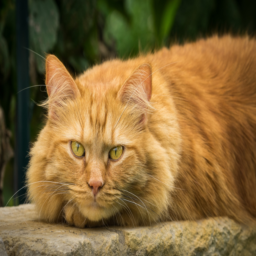

In [24]:
img_small = img.resize((256, 256), resample=Image.Resampling.BILINEAR)
print(f"Type of image: {type(img_small)} - Size of image: {img_small.size}")
img_small

**Question**: what can you observe from the image above?

In order to keep the aspect ratio, we have to define a scaling factor:

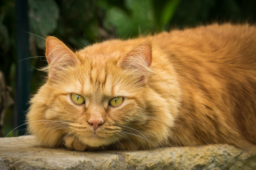

In [25]:
biggest_size = 256
height, width = img.size
scaling_factor = min(biggest_size / height, biggest_size / height)

new_width = int(width * scaling_factor)
new_height = int(height * scaling_factor)

img_small_aspect = img.resize((new_height, new_width), resample=Image.Resampling.BILINEAR)
img_small_aspect

In [26]:
img_small_aspect.size

(256, 170)

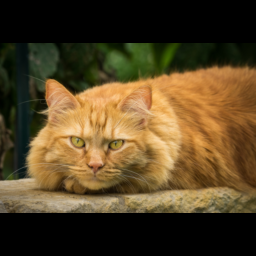

In [28]:
destination_height = 256
current_height = img_small_aspect.size[1]

band_height_above = (destination_height - current_height) // 2
band_height_below = destination_height - current_height - band_height_above

new_image = np.zeros((256, 256, 3), dtype=np.uint8)

img_small_aspect_array = np.array(img_small_aspect)

new_image[band_height_above:-band_height_below, :, :] = img_small_aspect_array

Image.fromarray(new_image)

**DIY**: add black padding around image on the smallest of the 2 dimensions, so we can have a 256 x 256 image

In [ ]:
# your code here

For what concerns image preprocessing, keras also comes with a preprocessing module (`keras.preprocessing`).

Here is an example for rotation. The ImageDataGenerator object allows us to operate multiple preprocessing steps with one single object, see the [API reference](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator) here.

When the preprocessing has been created, we can optionally call `.fit()` if we need to fit some parameters to some data, e.g., for normalizing.

To apply the preprocessing, we call `.flow()` on the generator.
Flow is supposed to work on a **batch**, so we need to add an extra dimension to one image to make it work.

**Notice**: a batch of images has shape $b \times h \times w \times 3$, where $b$ is the batch size, $h, w$ are the height and width of the images.


flow returns a (lazy) **iterator**. We have to loop through it to get the augmented image:

In [34]:
f = preprocessing.image.ImageDataGenerator(
    rotation_range=45
)

augmented_img = next(f.flow(np.expand_dims(img_small, axis=0)))
augmented_img.shape, augmented_img.dtype

((1, 256, 256, 3), dtype('float32'))

**DIY**: Given the image size above, we need to:
* remove the extra batch dimension
* convert the image from float32 to uint8
* plot the image

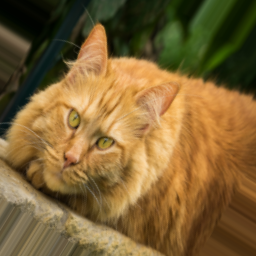

In [35]:
Image.fromarray(augmented_img[0].astype("uint8"))

Some preprocessing functions may not be present and you may need to implement them by hand. Here an example with the occlusion with a box of a size in a given range and a given color (black as default):

In [37]:
def occlude_array(img_array, patch_size_range=(10, 50), color=(0,0,0)):
    img_array_new = img_array.copy()
    patch_size = np.random.randint(patch_size_range[0], patch_size_range[1]+1, 2)

    patch_size_position_row_min = np.random.randint(img_array_new.shape[0])
    patch_size_position_row_max = min(img_array_new.shape[0], patch_size_position_row_min + patch_size[0])
    patch_size_position_col_min = np.random.randint(img_array_new.shape[1])
    patch_size_position_col_max = min(img_array_new.shape[1], patch_size_position_col_min + patch_size[1])

    img_array_new[patch_size_position_row_min:patch_size_position_row_max, patch_size_position_col_min:patch_size_position_col_max] = color
    return img_array_new
    

Let's see it in action:

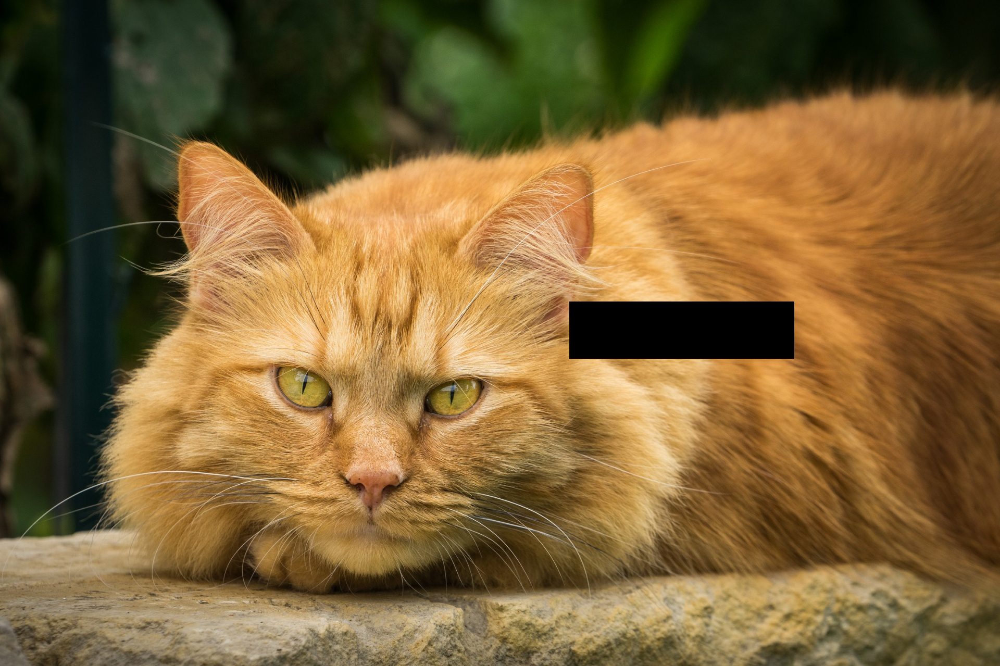

In [38]:
img_array_occluded = occlude_array(img_array, patch_size_range=(100, 500))

Image.fromarray(img_array_occluded)

**torchvision**, a PyTorch module, also has some useful preprocessing or augmenting functions. Here is an example with a composition of 
* random rotation (from -45° to 45°)
* color jittering

/root/miniconda3/envs/oop/lib/python3.10/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


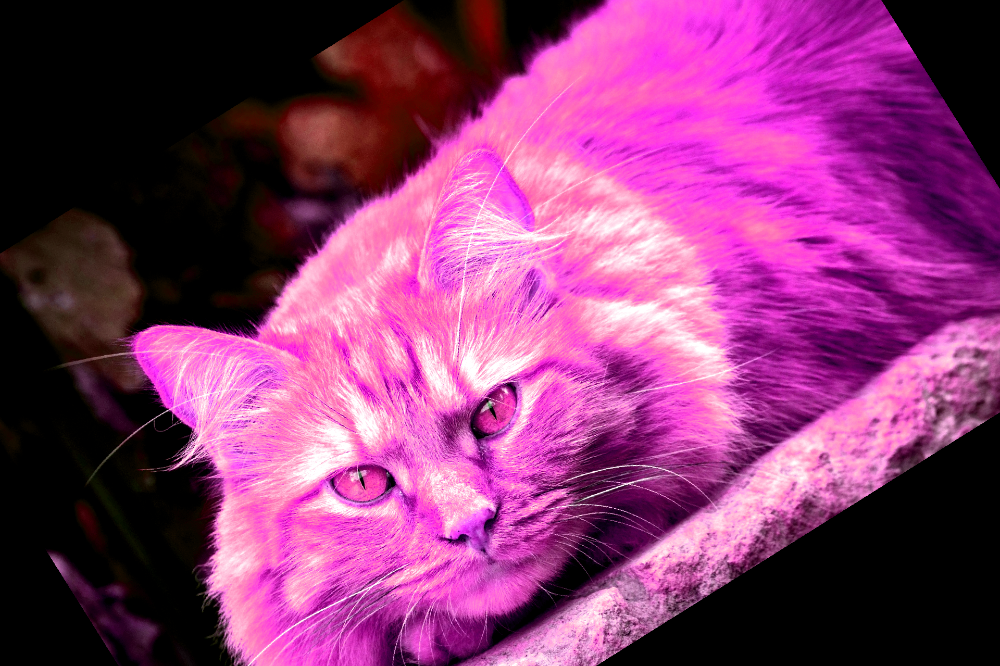

In [39]:
from torchvision import transforms as T

transform = T.Compose([
    T.RandomRotation(45),
    T.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5),
])

augmented_img = transform(img)
augmented_img

Let's now import a full dataset with keras.

Given the folder structure we have now, we can already import the dataset using `keras.utils.image_dataset_from_directory`. Here is the [keras API](https://keras.io/api/data_loading/image/).

Notice how the loading of the dataset already prepares the data to be **split into batches** and preprocessed onto a given **image size**.

In [ ]:
import keras

dataset = keras.utils.image_dataset_from_directory(
    "dataset",
    labels = "inferred",
    batch_size = 3,
    image_size = (256, 256),
    color_mode = "rgb",
    interpolation = "bilinear",
)

print("Dataset type:" , type(dataset))

Found 11 files belonging to 2 classes.
Dataset type: <class 'tensorflow.python.data.ops.batch_op._BatchDataset'>


We can see keras already identified 11 images in 2 classes.

If we want to access a batch of images (and the corresponding labels), we have to:

* convert the dataset into an iterator with `iter`
* get the first element of the iterator with `next`

In [41]:
batch = next(iter(dataset))
batch

2025-03-19 12:10:44.350514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [11]
	 [[{{node Placeholder/_0}}]]
2025-03-19 12:10:44.351078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [11]
	 [[{{node Placeholder/_0}}]]


(<tf.Tensor: shape=(3, 256, 256, 3), dtype=float32, numpy=
 array([[[[132.50693  , 112.50693  ,  85.50693  ],
          [130.60547  , 110.60547  ,  83.60547  ],
          [129.88281  , 109.88281  ,  82.88281  ],
          ...,
          [160.88281  , 130.88281  , 106.88281  ],
          [160.16016  , 130.16016  , 106.16016  ],
          [163.88281  , 133.88281  , 109.88281  ]],
 
         [[131.49875  , 111.49875  ,  84.49875  ],
          [129.3711   , 109.37109  ,  82.37109  ],
          [128.64844  , 108.64844  ,  81.64844  ],
          ...,
          [159.3422   , 129.3422   , 105.34219  ],
          [158.82828  , 128.82828  , 104.82828  ],
          [162.64844  , 132.64844  , 108.64844  ]],
 
         [[129.98828  , 109.98828  ,  82.98828  ],
          [128.13672  , 108.13672  ,  81.13672  ],
          [127.41406  , 107.41406  ,  80.41406  ],
          ...,
          [157.54297  , 127.54297  , 103.54297  ],
          [157.41406  , 127.41406  , 103.41406  ],
          [160.82812  ,

Let's see the type of the batch

In [43]:
type(batch), len(batch)

(tuple, 2)

Why is it a tuple and not an array?

Let's explore...

In [44]:
images, labels = batch
images.shape, labels.shape

(TensorShape([3, 256, 256, 3]), TensorShape([3]))

In [45]:
img = images[0]
img.shape

TensorShape([256, 256, 3])

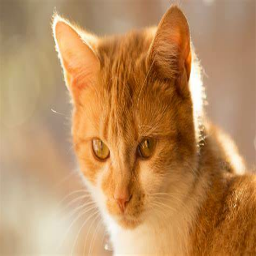

In [47]:
Image.fromarray(img.numpy().astype("uint8"))

We will see later how we can use the dataset to train a model...